In [ ]:

# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
!pip install pm4py
import pm4py
from datetime import datetime
import pandas as pd
!pip install -U ortools
import os

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26096 sha256=6f0235662428990ac00c8618b0931ffacfeb3b9d86c461500683214a026234d2
  Stored in directory: /root/.cache/pip/wheels/fa/80/8c/43488a924a046b733b64de3fac99252674c892a4c3801c0a61
Successfully built intervaltree
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.8/24.8 MB 34.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.7/133.7 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.8/302.8 kB 29.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0
ERROR: pip

In [ ]:
ocel = pm4py.read_ocel2_xml("/content/order-management.xml")

/usr/local/lib/python3.10/dist-packages/pm4py/util/dt_parsing/parser.py:77: UserWarning: ISO8601 strings are not fully supported with strpfromiso for Python versions below 3.11
  warnings.warn(


['orders', 'items', 'packages', 'customers', 'products', 'employees']

In [ ]:
'''
    This file is part of PM4Py (More Info: https://pm4py.fit.fraunhofer.de).

    PM4Py is free software: you can redistribute it and/or modify
    it under the terms of the GNU General Public License as published by
    the Free Software Foundation, either version 3 of the License, or
    (at your option) any later version.

    PM4Py is distributed in the hope that it will be useful,
    but WITHOUT ANY WARRANTY; without even the implied warranty of
    MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
    GNU General Public License for more details.

    You should have received a copy of the GNU General Public License
    along with PM4Py.  If not, see <https://www.gnu.org/licenses/>.
'''
from enum import Enum
from typing import Optional, Dict, Any

import pandas as pd

from pm4py.objects.ocel import constants as ocel_constants
from pm4py.objects.ocel.obj import OCEL
from pm4py.util import constants, xes_constants
from pm4py.util import exec_utils


class Parameters(Enum):
    EVENT_ACTIVITY = ocel_constants.PARAM_EVENT_ACTIVITY
    EVENT_TIMESTAMP = ocel_constants.PARAM_EVENT_TIMESTAMP



def flatten(ocel: OCEL, parameters: Optional[Dict[Any, Any]] = None, *ot: str) -> pd.DataFrame:
    """
    Flattens the object-centric event log to a traditional event log with the choice of multiple object types.
    In the flattened log, the objects of a given object type are the cases, and each case
    contains the set of events related to the object.

    Parameters
    -------------------
    ocel
        Object-centric event log
    parameters
        Parameters of the algorithm, including:
        - Parameters.EVENT_ACTIVITY
        - Parameters.EVENT_TIMESTAMP
    *ot
        Object types as variable number of arguments
    Returns
    ------------------
    dataframe
        Flattened log in the form of a Pandas dataframe
    """
    if parameters is None:
        parameters = {}

    event_activity = exec_utils.get_param_value(Parameters.EVENT_ACTIVITY, parameters,
                                                ocel.event_activity)
    event_timestamp = exec_utils.get_param_value(Parameters.EVENT_TIMESTAMP, parameters,
                                                 ocel.event_timestamp)

    # Initialize an empty list to store the resulting dataframes
    result_dfs = []

    # Loop through each object type
    for obj_type in ot:
        objects = ocel.objects[ocel.objects[ocel.object_type_column] == obj_type]
        objects = objects.rename(columns={ocel.object_id_column: xes_constants.DEFAULT_TRACEID_KEY})
        objects = objects.rename(columns={x: constants.CASE_ATTRIBUTE_PREFIX + x for x in objects.columns})

        relations = ocel.relations[ocel.relations[ocel.object_type_column] == obj_type][
            [ocel.object_id_column, ocel.event_id_column]]
        relations = relations.rename(columns={ocel.object_id_column: constants.CASE_CONCEPT_NAME})

        objects = objects.merge(relations, on=constants.CASE_CONCEPT_NAME)

        events = ocel.events.merge(objects, on=ocel.event_id_column).rename(
            columns={event_activity: xes_constants.DEFAULT_NAME_KEY, event_timestamp: xes_constants.DEFAULT_TIMESTAMP_KEY})

        result_dfs.append(events)

    # Concatenate all resulting dataframes
    result_df = pd.concat(result_dfs, ignore_index=True)

    from pm4py.utils import format_dataframe

    return result_df

In [ ]:
object_types = ["products", "employees"]
result = flatten(ocel, *object_types)
print(result)

TypeError: string indices must be integers

In [ ]:
df = pm4py.convert_to_dataframe(flattened_log_o)
df.head()
print(df.columns)

Index(['ocel:eid', 'concept:name', 'time:timestamp', 'case:concept:name',
       'case:ocel:type'],
      dtype='object')


In [ ]:
print(df)

                   ocel:eid      concept:name            time:timestamp  \
0            place_o-990001       place order 2023-04-03 10:08:18+00:00   
1            place_o-990002       place order 2023-04-03 14:36:55+00:00   
2            place_o-990003       place order 2023-04-03 21:31:23+00:00   
3            place_o-990004       place order 2023-04-04 10:30:50+00:00   
4          confirm_o-990002     confirm order 2023-04-04 14:09:41+00:00   
...                     ...               ...                       ...   
6561           pay_o-991907         pay order 2024-05-09 14:37:00+00:00   
6562  reminder_o-991917_565  payment reminder 2024-05-10 11:48:04+00:00   
6563  reminder_o-991986_566  payment reminder 2024-05-20 20:17:28+00:00   
6564           pay_o-991917         pay order 2024-05-23 16:40:59+00:00   
6565           pay_o-991986         pay order 2024-06-04 18:12:07+00:00   

     case:concept:name case:ocel:type  
0             o-990001         orders  
1             o-990

In [ ]:
print(len(df['ocel:eid']))

6566


In [ ]:
print(df['concept:name'].nunique())

4


In [ ]:
ot_activities = pm4py.ocel_object_type_activities(ocel)
print(ot_activities)

{'customers': {'place order', 'confirm order'}, 'employees': {'create package', 'failed delivery', 'package delivered', 'reorder item', 'confirm order', 'item out of stock', 'pick item', 'send package'}, 'items': {'payment reminder', 'create package', 'failed delivery', 'pay order', 'package delivered', 'reorder item', 'place order', 'confirm order', 'item out of stock', 'pick item', 'send package'}, 'orders': {'payment reminder', 'confirm order', 'place order', 'pay order'}, 'products': {'payment reminder', 'create package', 'failed delivery', 'pay order', 'package delivered', 'reorder item', 'place order', 'confirm order', 'item out of stock', 'pick item', 'send package'}, 'packages': {'package delivered', 'send package', 'create package', 'failed delivery'}}


In [ ]:
objects_ot_count = pm4py.ocel_objects_ot_count(ocel)
print(objects_ot_count)

{'confirm_o-990001': Counter({'items': 3, 'products': 2, 'customers': 1, 'employees': 1, 'orders': 1}), 'confirm_o-990002': Counter({'products': 3, 'items': 3, 'customers': 1, 'employees': 1, 'orders': 1}), 'confirm_o-990003': Counter({'items': 6, 'products': 5, 'customers': 1, 'employees': 1, 'orders': 1}), 'confirm_o-990004': Counter({'items': 8, 'products': 7, 'customers': 1, 'employees': 1, 'orders': 1}), 'confirm_o-990005': Counter({'products': 5, 'items': 5, 'customers': 1, 'employees': 1, 'orders': 1}), 'confirm_o-990006': Counter({'items': 7, 'products': 6, 'customers': 1, 'employees': 1, 'orders': 1}), 'confirm_o-990007': Counter({'items': 7, 'products': 5, 'employees': 1, 'customers': 1, 'orders': 1}), 'confirm_o-990008': Counter({'products': 4, 'items': 4, 'customers': 1, 'employees': 1, 'orders': 1}), 'confirm_o-990009': Counter({'products': 4, 'items': 4, 'employees': 1, 'customers': 1, 'orders': 1}), 'confirm_o-990010': Counter({'items': 4, 'products': 4, 'employees': 1, 

In [ ]:
objects_summary = pm4py.ocel_objects_summary(ocel)
print(objects_summary)

                        ocel:oid  \
0               Alessandro Berti   
1       AlpenTech Innovations AG   
2         Balkan Minerals d.o.o.   
3      Baltic Wave Energies Ltd.   
4                 Benedikt Knopp   
...                          ...   
10835                   p-661124   
10836                   p-661125   
10837                   p-661126   
10838                   p-661127   
10839                   p-661128   

                                    activities_lifecycle  \
0      [send package, package delivered, send package...   
1      [place order, place order, confirm order, conf...   
2      [place order, confirm order, place order, conf...   
3      [place order, confirm order, place order, conf...   
4      [pick item, item out of stock, pick item, pick...   
...                                                  ...   
10835  [create package, send package, package delivered]   
10836  [create package, send package, package delivered]   
10837  [create package, sen

In [ ]:
interactions_summary = pm4py.ocel_objects_interactions_summary(ocel)
print(interactions_summary)

                 ocel:eid  ocel:activity                  ocel:oid  ocel:type  \
0        confirm_o-990001  confirm order  AlpenTech Innovations AG  customers   
1        confirm_o-990001  confirm order  AlpenTech Innovations AG  customers   
2        confirm_o-990001  confirm order  AlpenTech Innovations AG  customers   
3        confirm_o-990001  confirm order  AlpenTech Innovations AG  customers   
4        confirm_o-990001  confirm order  AlpenTech Innovations AG  customers   
...                   ...            ...                       ...        ...   
1526491     send_p-661128   send package                  i-887573      items   
1526492     send_p-661128   send package                  p-661128   packages   
1526493     send_p-661128   send package                  p-661128   packages   
1526494     send_p-661128   send package                  p-661128   packages   
1526495     send_p-661128   send package                  p-661128   packages   

                ocel:oid_2 

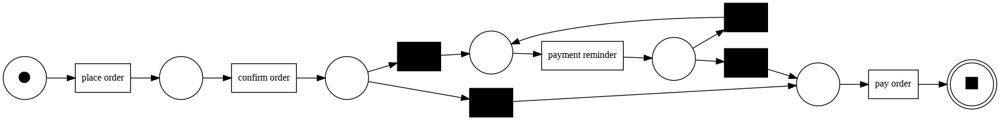

In [ ]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_o)
pm4py.view_petri_net(net, im, fm)

In [ ]:
replayed_traces_a = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_a


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(143d22e8-e323-4eae-92fe-7f76550ec660, 'place order'),
   (39ec73b0-5574-4eca-8ca1-ddbcf63f9042, 'confirm order'),
   (skip_1, None),
   (bc9f8511-862f-45c2-8c8b-4ecdc3c571f0, 'pay order')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(143d22e8-e323-4eae-92fe-7f76550ec660, 'place order'),
   (39ec73b0-5574-4eca-8ca1-ddbcf63f9042, 'confirm order'),
   (skip_1, None),
   (bc9f8511-862f-45c2-8c8b-4ecdc3c571f0, 'pay order')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  

In [ ]:
fitness_a = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_a


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
precision_a = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_a


replaying log with TBR, completed traces ::   0%|          | 0/6 [00:00<?, ?it/s]

0.9997809899255365

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_a = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_a


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

0.960044016295738

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_a = simplicity_evaluator.apply(net)
simplicity_a

0.8823529411764706

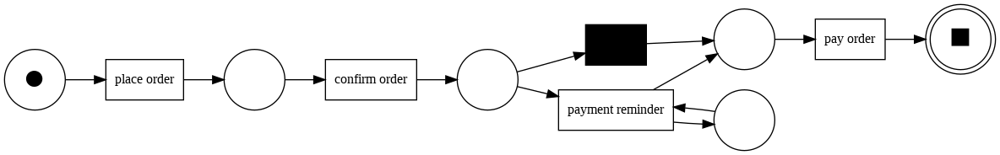

In [ ]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_o, dependency_threshold=0.91)
pm4py.view_petri_net(net, im, fm)

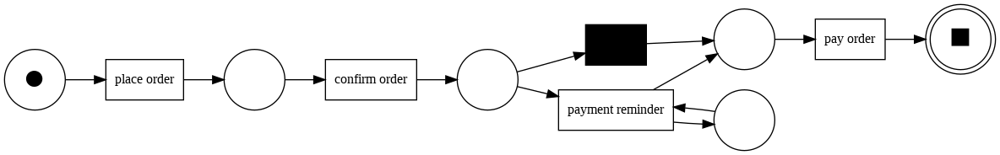

In [ ]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_o, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=1)
pm4py.view_heuristics_net(heu_net)

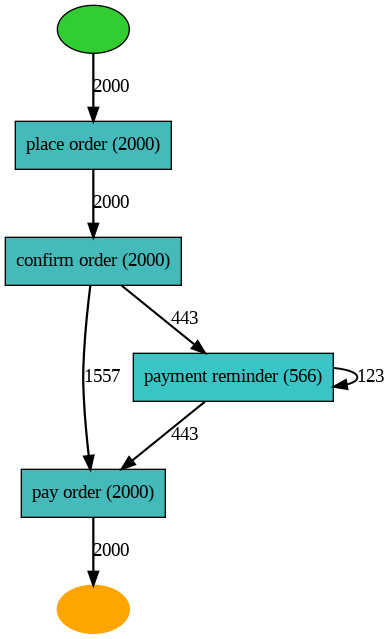

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=0.5)
pm4py.view_heuristics_net(heu_net)

In [ ]:
replayed_traces_a = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
replayed_traces_a

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(place order, 'place order'),
   (confirm order, 'confirm order'),
   (hid_4, None),
   (pay order, 'pay order')],
  'reached_marking': ['sink0:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(place order, 'place order'),
   (confirm order, 'confirm order'),
   (hid_4, None),
   (pay order, 'pay order')],
  'reached_marking': ['sink0:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': False,
  'trace_fitness': 0.8333333333333334,
  'activated_transitions': [(place order, 'place order'),
   (confirm order, 'confirm order'),
   (payment reminder, 'payment reminder')

In [ ]:
replayed_traces_a = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_a
fitness_a = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_a




replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

{'perc_fit_traces': 77.85,
 'average_trace_fitness': 0.9583833333333284,
 'log_fitness': 0.9470483674805875,
 'percentage_of_fitting_traces': 77.85}

In [ ]:
precision_a = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_a


replaying log with TBR, completed traces ::   0%|          | 0/6 [00:00<?, ?it/s]

1.0

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_a = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_a


replaying log with TBR, completed traces ::   0%|          | 0/5 [00:00<?, ?it/s]

0.9731083922923526

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_a = simplicity_evaluator.apply(net)
simplicity_a

0.8461538461538463

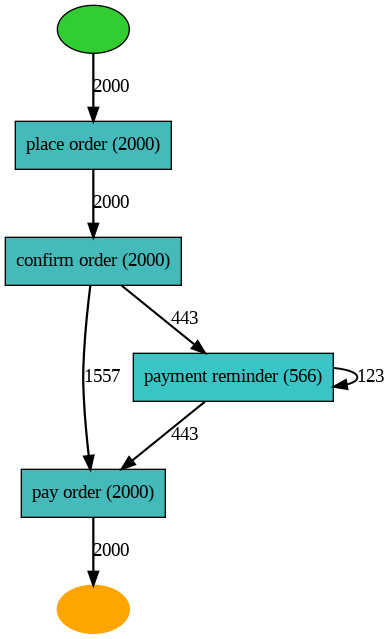

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=0.91)
pm4py.view_heuristics_net(heu_net)

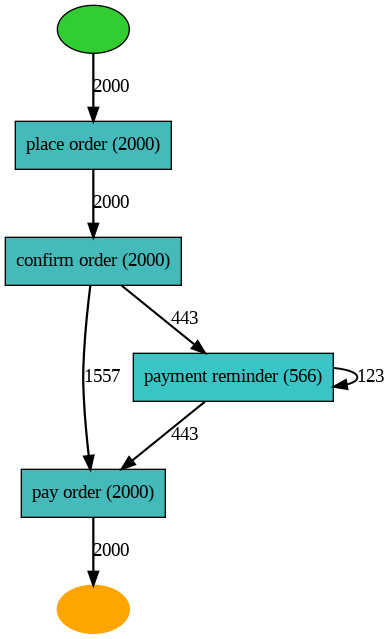

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [ ]:
flattened_log_w = pm4py.ocel_flattening(ocel, "items")
print(flattened_log_w)


             ocel:eid concept:name            time:timestamp  \
0      place_o-990001  place order 2023-04-03 10:08:18+00:00   
1      place_o-990001  place order 2023-04-03 10:08:18+00:00   
2      place_o-990001  place order 2023-04-03 10:08:18+00:00   
3       pick_i-880003    pick item 2023-04-03 11:21:49+00:00   
4      place_o-990002  place order 2023-04-03 14:36:55+00:00   
...               ...          ...                       ...   
60930    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
60931    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
60932    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
60933    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
60934    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   

      case:concept:name case:ocel:type  
0              i-880001          items  
1              i-880002          items  
2              i-880003          items  
3              i-880003          items  
4              i-880004   

In [ ]:
df = pm4py.convert_to_dataframe(flattened_log_w)
df.head()


,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,place_o-990001,place order,2023-04-03 10:08:18+00:00,i-880001,items
1,place_o-990001,place order,2023-04-03 10:08:18+00:00,i-880002,items
2,place_o-990001,place order,2023-04-03 10:08:18+00:00,i-880003,items
3,pick_i-880003,pick item,2023-04-03 11:21:49+00:00,i-880003,items
4,place_o-990002,place order,2023-04-03 14:36:55+00:00,i-880004,items


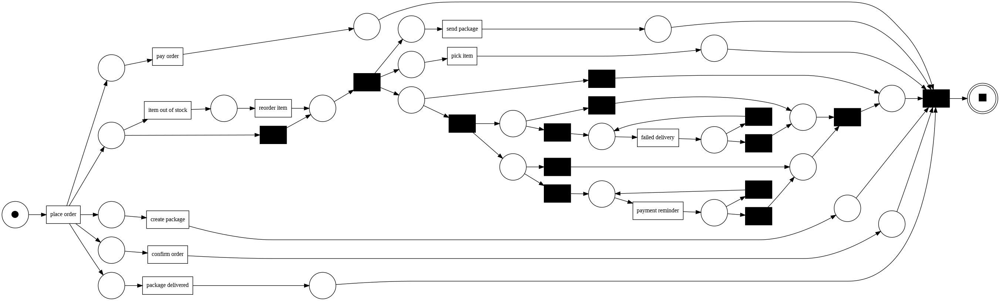

In [ ]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_w)
pm4py.view_petri_net(net, im, fm)

In [ ]:
replayed_traces_w = pm4py.conformance_diagnostics_token_based_replay(flattened_log_w, net, im, fm)
replayed_traces_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(fcaadf16-209c-489f-b98b-90843569bb2a, 'place order'),
   (skip_4, None),
   (tauSplit_5, None),
   (967d5d7e-0792-45e2-bff1-4b2a3f24b7a8, 'pick item'),
   (cedbac83-50f4-4c51-a587-0acc4086a3ab, 'confirm order'),
   (6d92b665-3be5-4ae7-af06-d12368cb2490, 'pay order'),
   (d219597a-72ef-439c-b449-9d0267c6b75f, 'create package'),
   (9d70f6f3-d61a-4bd3-97ec-3f641ac2ff2c, 'send package'),
   (8bf55d9e-cbf5-471f-bdbd-4f6c2d7be710, 'package delivered'),
   (skip_7, None),
   (tauJoin_3, None)],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 18,
  'remaining_tokens': 0,
  'produced_tokens': 18},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(fcaadf16-209c-489f-b98b-90843569bb2a, 'place order'),
   (skip_4, None),
   (tauSplit_5, None),
   (967d5d7e-0792-45e2-bff1-4b2a3f24b7a8, 'pic

In [ ]:
fitness_w = pm4py.fitness_token_based_replay(flattened_log_w, net, im, fm)
fitness_w



replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
precision_w = pm4py.precision_token_based_replay(flattened_log_w, net, im, fm)
precision_w


replaying log with TBR, completed traces ::   0%|          | 0/550 [00:00<?, ?it/s]

0.5602098635886674

In [ ]:

from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_w = generalization_evaluator.apply(flattened_log_w, net, im, fm)
generalization_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

0.9797938998759402

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_w = simplicity_evaluator.apply(net)
simplicity_w

0.6842105263157894

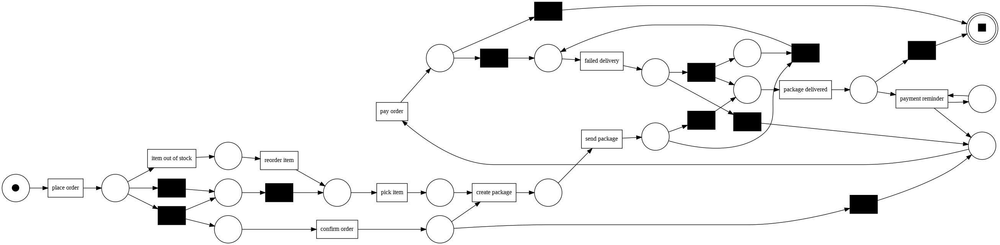

In [ ]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_w, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

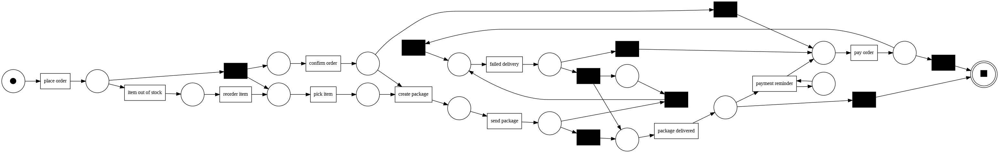

In [ ]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_w, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [ ]:
replayed_traces_w = pm4py.conformance_diagnostics_token_based_replay(flattened_log_w, net, im, fm)
replayed_traces_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

[{'trace_is_fit': False,
  'trace_fitness': 0.9230769230769231,
  'activated_transitions': [(place order, 'place order'),
   (hid_25, None),
   (pick item, 'pick item'),
   (confirm order, 'confirm order'),
   (hid_13, None),
   (pay order, 'pay order'),
   (create package, 'create package'),
   (send package, 'send package'),
   (hid_17, None),
   (package delivered, 'package delivered'),
   (hid_22, None)],
  'reached_marking': ['intplace_pay order:1', 'sink0:1'],
  'enabled_transitions_in_marking': {(failed delivery, 'failed delivery')},
  'transitions_with_problems': [(create package, 'create package')],
  'missing_tokens': 1,
  'consumed_tokens': 13,
  'remaining_tokens': 1,
  'produced_tokens': 13},
 {'trace_is_fit': False,
  'trace_fitness': 0.9230769230769231,
  'activated_transitions': [(place order, 'place order'),
   (hid_25, None),
   (pick item, 'pick item'),
   (confirm order, 'confirm order'),
   (hid_13, None),
   (pay order, 'pay order'),
   (create package, 'create pa

In [ ]:
fitness_w = pm4py.fitness_token_based_replay(flattened_log_w, net, im, fm)
fitness_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0,
 'average_trace_fitness': 0.8992225899541795,
 'log_fitness': 0.8961472257831714,
 'percentage_of_fitting_traces': 0.0}

In [ ]:
precision_w = pm4py.precision_token_based_replay(flattened_log_w, net, im, fm)
precision_w


replaying log with TBR, completed traces ::   0%|          | 0/550 [00:00<?, ?it/s]

0.9790028917665217

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_w = generalization_evaluator.apply(flattened_log_w, net, im, fm)
generalization_w


replaying log with TBR, completed traces ::   0%|          | 0/286 [00:00<?, ?it/s]

0.978096249803841

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_w = simplicity_evaluator.apply(net)
simplicity_w

0.7037037037037037

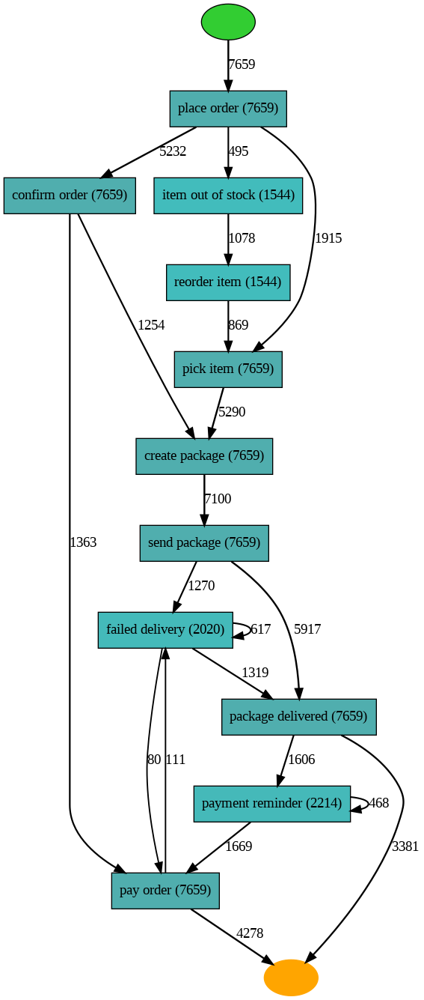

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_w, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [ ]:
flattened_log_o = pm4py.ocel_flattening(ocel, "packages")
print(flattened_log_o)


              ocel:eid       concept:name            time:timestamp  \
0      create_p-660001     create package 2023-04-07 23:00:00+00:00   
1        send_p-660001       send package 2023-04-10 08:40:42+00:00   
2     deliver_p-660001  package delivered 2023-04-11 09:03:27+00:00   
3      create_p-660002     create package 2023-04-12 07:52:12+00:00   
4      create_p-660003     create package 2023-04-12 13:59:22+00:00   
...                ...                ...                       ...   
3690     send_p-661127       send package 2024-05-27 09:58:49+00:00   
3691  deliver_p-661127  package delivered 2024-05-28 10:49:37+00:00   
3692   create_p-661128     create package 2024-05-31 23:00:00+00:00   
3693     send_p-661128       send package 2024-06-03 08:20:59+00:00   
3694  deliver_p-661128  package delivered 2024-06-03 10:17:54+00:00   

     case:concept:name case:ocel:type  
0             p-660001       packages  
1             p-660001       packages  
2             p-660001     

In [ ]:
df = pm4py.convert_to_dataframe(flattened_log_o)
df.head()


,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,create_p-660001,create package,2023-04-07 23:00:00+00:00,p-660001,packages
1,send_p-660001,send package,2023-04-10 08:40:42+00:00,p-660001,packages
2,deliver_p-660001,package delivered,2023-04-11 09:03:27+00:00,p-660001,packages
3,create_p-660002,create package,2023-04-12 07:52:12+00:00,p-660002,packages
4,create_p-660003,create package,2023-04-12 13:59:22+00:00,p-660003,packages


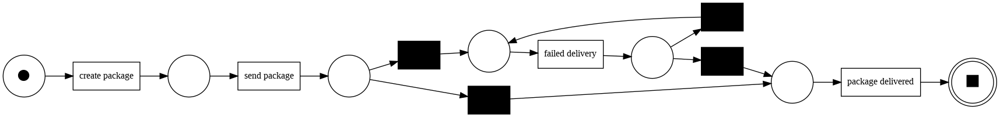

In [ ]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_o)
pm4py.view_petri_net(net, im, fm)

In [ ]:
replayed_traces_o = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(0325fc9e-32d7-40c8-aaa9-249d44941c3d, 'create package'),
   (2fb22700-bc73-40cc-97da-1991d5670279, 'send package'),
   (skip_1, None),
   (692667d9-621f-4cab-9ccb-d250e6278864, 'package delivered')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(0325fc9e-32d7-40c8-aaa9-249d44941c3d, 'create package'),
   (2fb22700-bc73-40cc-97da-1991d5670279, 'send package'),
   (skip_1, None),
   (692667d9-621f-4cab-9ccb-d250e6278864, 'package delivered')],
  'reached_marking': ['sink:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'tra

In [ ]:
fitness_o = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
precision_o = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_o


replaying log with TBR, completed traces ::   0%|          | 0/9 [00:00<?, ?it/s]

0.9996104402025711

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_o = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

0.9478303300200297

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_o = simplicity_evaluator.apply(net)
simplicity_o

0.8823529411764706

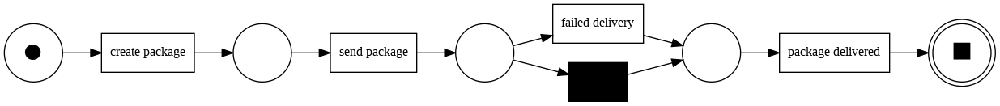

In [ ]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_o, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [ ]:
replayed_traces_o = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(create package, 'create package'),
   (send package, 'send package'),
   (hid_4, None),
   (package delivered, 'package delivered')],
  'reached_marking': ['sink0:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(create package, 'create package'),
   (send package, 'send package'),
   (hid_4, None),
   (package delivered, 'package delivered')],
  'reached_marking': ['sink0:1'],
  'enabled_transitions_in_marking': set(),
  'transitions_with_problems': [],
  'missing_tokens': 0,
  'consumed_tokens': 5,
  'remaining_tokens': 0,
  'produced_tokens': 5},
 {'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(create package, 'create package'),
   (send package, 'send package'),
   (hid_4, No

In [ ]:
fitness_o = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

{'perc_fit_traces': 94.23758865248227,
 'average_trace_fitness': 0.9874692018973934,
 'log_fitness': 0.9830922084713265,
 'percentage_of_fitting_traces': 94.23758865248227}

In [ ]:
precision_o = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_o


replaying log with TBR, completed traces ::   0%|          | 0/9 [00:00<?, ?it/s]

1.0

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_o = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_o


replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

0.9641788884157065

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_o = simplicity_evaluator.apply(net)
simplicity_o

1.0

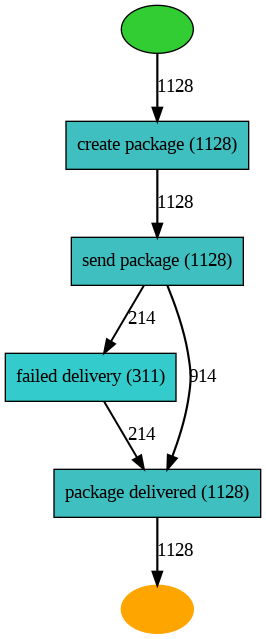

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_o, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [ ]:
flattened_log_cr = pm4py.ocel_flattening(ocel, "customers")
print(flattened_log_cr)


              ocel:eid   concept:name            time:timestamp  \
0       place_o-990001    place order 2023-04-03 10:08:18+00:00   
1       place_o-990002    place order 2023-04-03 14:36:55+00:00   
2       place_o-990003    place order 2023-04-03 21:31:23+00:00   
3       place_o-990004    place order 2023-04-04 10:30:50+00:00   
4     confirm_o-990002  confirm order 2023-04-04 14:09:41+00:00   
...                ...            ...                       ...   
3995  confirm_o-991997  confirm order 2024-03-25 09:44:24+00:00   
3996  confirm_o-991992  confirm order 2024-03-25 10:18:10+00:00   
3997  confirm_o-991998  confirm order 2024-03-25 12:15:25+00:00   
3998  confirm_o-991996  confirm order 2024-03-25 16:59:02+00:00   
3999  confirm_o-992000  confirm order 2024-03-26 13:19:17+00:00   

                      case:concept:name case:ocel:type  
0              AlpenTech Innovations AG      customers  
1              AlpenTech Innovations AG      customers  
2                Celtica

In [ ]:
df = pm4py.convert_to_dataframe(flattened_log_cr)
df.head()


,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,place_o-990001,place order,2023-04-03 10:08:18+00:00,AlpenTech Innovations AG,customers
1,place_o-990002,place order,2023-04-03 14:36:55+00:00,AlpenTech Innovations AG,customers
2,place_o-990003,place order,2023-04-03 21:31:23+00:00,Celtica Green Farms Oy,customers
3,place_o-990004,place order,2023-04-04 10:30:50+00:00,Baltic Wave Energies Ltd.,customers
4,confirm_o-990002,confirm order,2023-04-04 14:09:41+00:00,AlpenTech Innovations AG,customers


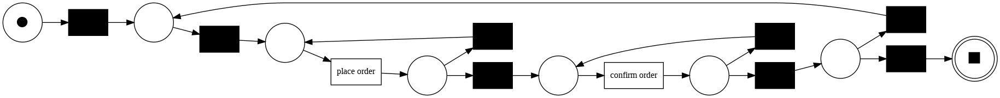

In [ ]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_cr)
pm4py.view_petri_net(net, im, fm)

In [ ]:
replayed_traces_cr = pm4py.conformance_diagnostics_token_based_replay(flattened_log_cr, net, im, fm)
replayed_traces_cr


replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(tau_1, None),
   (init_loop_5, None),
   (f6f5cdc2-73ad-4337-9dd1-d220038f67a2, 'place order'),
   (skip_7, None),
   (f6f5cdc2-73ad-4337-9dd1-d220038f67a2, 'place order'),
   (skip_8, None),
   (106c891d-06b7-4901-859a-304b3f094294, 'confirm order'),
   (skip_11, None),
   (106c891d-06b7-4901-859a-304b3f094294, 'confirm order'),
   (skip_12, None),
   (skip_13, None),
   (init_loop_5, None),
   (f6f5cdc2-73ad-4337-9dd1-d220038f67a2, 'place order'),
   (skip_8, None),
   (106c891d-06b7-4901-859a-304b3f094294, 'confirm order'),
   (skip_12, None),
   (skip_13, None),
   (init_loop_5, None),
   (f6f5cdc2-73ad-4337-9dd1-d220038f67a2, 'place order'),
   (skip_8, None),
   (106c891d-06b7-4901-859a-304b3f094294, 'confirm order'),
   (skip_12, None),
   (skip_13, None),
   (init_loop_5, None),
   (f6f5cdc2-73ad-4337-9dd1-d220038f67a2, 'place order'),
   (skip_8, None),
   (106c891d-06b7-4901-859a-304b3f094294, 'confi

In [ ]:
fitness_cr = pm4py.fitness_token_based_replay(flattened_log_cr, net, im, fm)
fitness_cr


replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
precision_cr = pm4py.precision_token_based_replay(flattened_log_cr, net, im, fm)
precision_cr


replaying log with TBR, completed traces ::   0%|          | 0/3819 [00:00<?, ?it/s]

0.6741854636591479

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_cr = generalization_evaluator.apply(flattened_log_cr, net, im, fm)
generalization_cr


replaying log with TBR, completed traces ::   0%|          | 0/15 [00:00<?, ?it/s]

0.9246299176795403

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_cr = simplicity_evaluator.apply(net)
simplicity_cr

0.8181818181818181

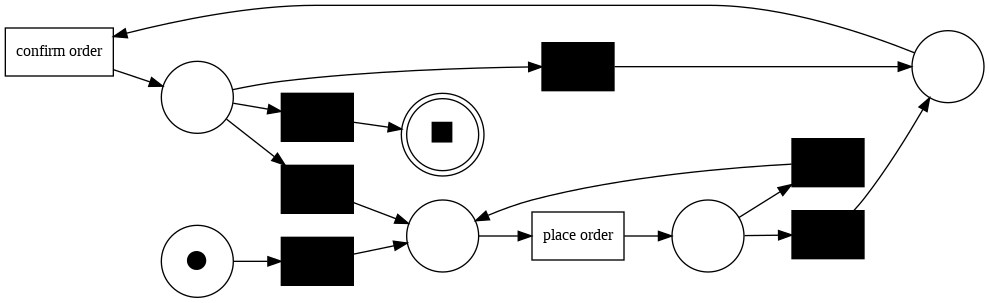

In [ ]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_cr, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_cr, dependency_threshold=1)
pm4py.view_heuristics_net(heu_net)

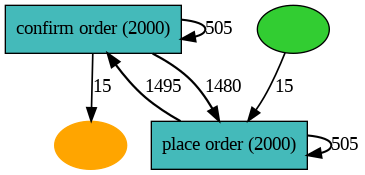

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_cr, dependency_threshold=0.5)
pm4py.view_heuristics_net(heu_net)

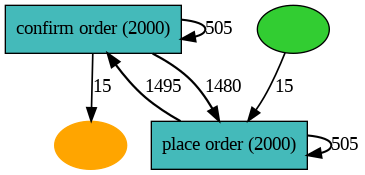

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_cr, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [ ]:
replayed_traces_w = pm4py.conformance_diagnostics_token_based_replay(flattened_log_o, net, im, fm)
replayed_traces_w
fitness_a = pm4py.fitness_token_based_replay(flattened_log_o, net, im, fm)
fitness_a
precision_a = pm4py.precision_token_based_replay(flattened_log_o, net, im, fm)
precision_a
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_a = generalization_evaluator.apply(flattened_log_o, net, im, fm)
generalization_a
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_a = simplicity_evaluator.apply(net)
simplicity_a

replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/9 [00:00<?, ?it/s]

replaying log with TBR, completed traces ::   0%|          | 0/7 [00:00<?, ?it/s]

0.7777777777777779

In [ ]:
flattened_log_pr = pm4py.ocel_flattening(ocel, "products")
print(flattened_log_pr)

             ocel:eid concept:name            time:timestamp  \
0      place_o-990001  place order 2023-04-03 10:08:18+00:00   
1      place_o-990001  place order 2023-04-03 10:08:18+00:00   
2       pick_i-880003    pick item 2023-04-03 11:21:49+00:00   
3      place_o-990002  place order 2023-04-03 14:36:55+00:00   
4      place_o-990002  place order 2023-04-03 14:36:55+00:00   
...               ...          ...                       ...   
54692    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
54693    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
54694    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
54695    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   
54696    pay_o-991986    pay order 2024-06-04 18:12:07+00:00   

       case:concept:name case:ocel:type  
0                   Echo       products  
1          iPhone 11 Pro       products  
2          iPhone 11 Pro       products  
3      Kindle Paperwhite       products  
4            MacBook 

In [ ]:
df = pm4py.convert_to_dataframe(flattened_log_pr)
df.head()

,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,place_o-990001,place order,2023-04-03 10:08:18+00:00,Echo,products
1,place_o-990001,place order,2023-04-03 10:08:18+00:00,iPhone 11 Pro,products
2,pick_i-880003,pick item,2023-04-03 11:21:49+00:00,iPhone 11 Pro,products
3,place_o-990002,place order,2023-04-03 14:36:55+00:00,Kindle Paperwhite,products
4,place_o-990002,place order,2023-04-03 14:36:55+00:00,MacBook Pro,products


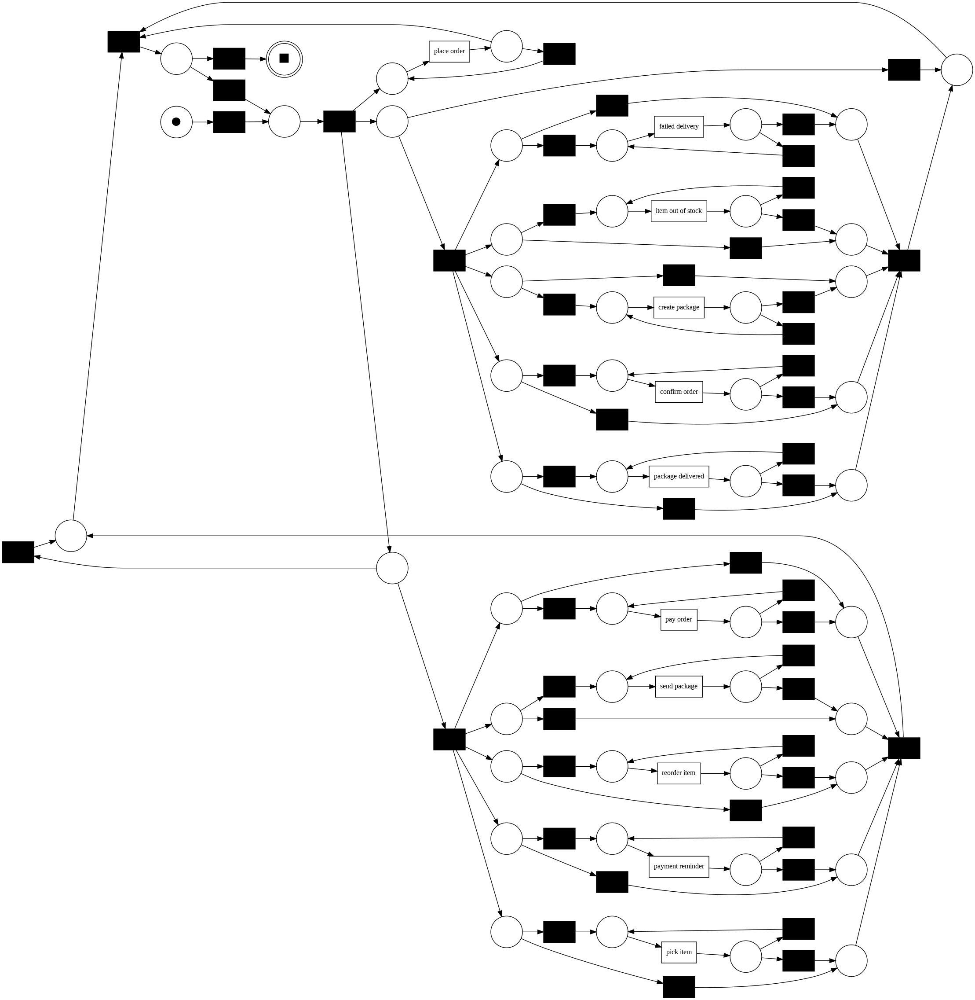

In [ ]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_pr)
pm4py.view_petri_net(net, im, fm)

In [ ]:
replayed_traces_pr = pm4py.conformance_diagnostics_token_based_replay(flattened_log_pr, net, im, fm)
replayed_traces_pr

replaying log with TBR, completed traces ::   0%|          | 0/20 [00:00<?, ?it/s]

[{'trace_is_fit': True,
  'trace_fitness': 1.0,
  'activated_transitions': [(tau_1, None),
   (tauSplit_5, None),
   (5b210bdd-c541-405f-9663-58dcbfc93910, 'place order'),
   (tauSplit_40, None),
   (init_loop_58, None),
   (472e598a-cf43-4138-bada-64fb272d6157, 'pick item'),
   (skip_9, None),
   (5b210bdd-c541-405f-9663-58dcbfc93910, 'place order'),
   (skip_60, None),
   (472e598a-cf43-4138-bada-64fb272d6157, 'pick item'),
   (tauSplit_12, None),
   (init_loop_30, None),
   (d46dfd43-cf65-4df0-bd44-41d19793938c, 'confirm order'),
   (skip_9, None),
   (5b210bdd-c541-405f-9663-58dcbfc93910, 'place order'),
   (skip_60, None),
   (472e598a-cf43-4138-bada-64fb272d6157, 'pick item'),
   (init_loop_63, None),
   (77b5ca52-107a-47b4-94bb-bae2b5711cf6, 'pay order'),
   (skip_32, None),
   (d46dfd43-cf65-4df0-bd44-41d19793938c, 'confirm order'),
   (init_loop_25, None),
   (3214290a-c94c-4cd0-93e8-1bd7ec3dbe09, 'item out of stock'),
   (init_loop_48, None),
   (39227b2e-751b-463f-ac9e-688d5

In [ ]:
fitness_pr = pm4py.fitness_token_based_replay(flattened_log_pr, net, im, fm)
fitness_pr

replaying log with TBR, completed traces ::   0%|          | 0/20 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
precision_pr = pm4py.precision_token_based_replay(flattened_log_pr, net, im, fm)

In [4]:

precision_pr


0.7893452023342223

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_pr = generalization_evaluator.apply(flattened_log_pr, net, im, fm)
generalization_pr

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_pr = simplicity_evaluator.apply(net)
simplicity_pr

In [ ]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_pr, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_pr, dependency_threshold=1)
pm4py.view_heuristics_net(heu_net)

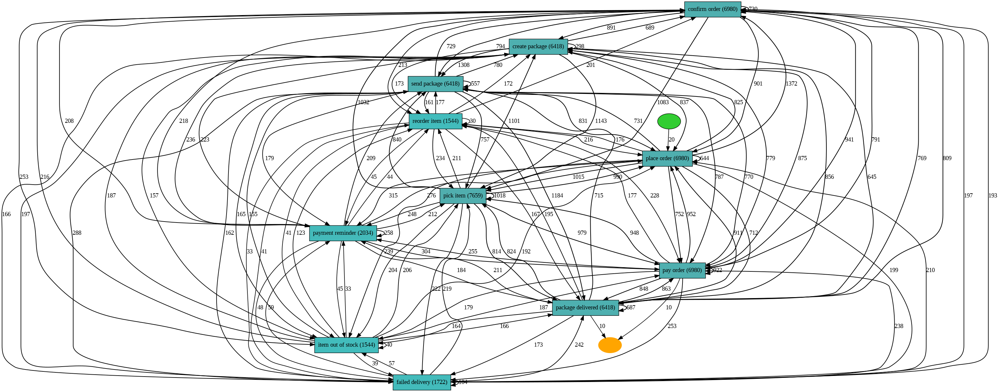

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_pr, dependency_threshold=0.5)
pm4py.view_heuristics_net(heu_net)

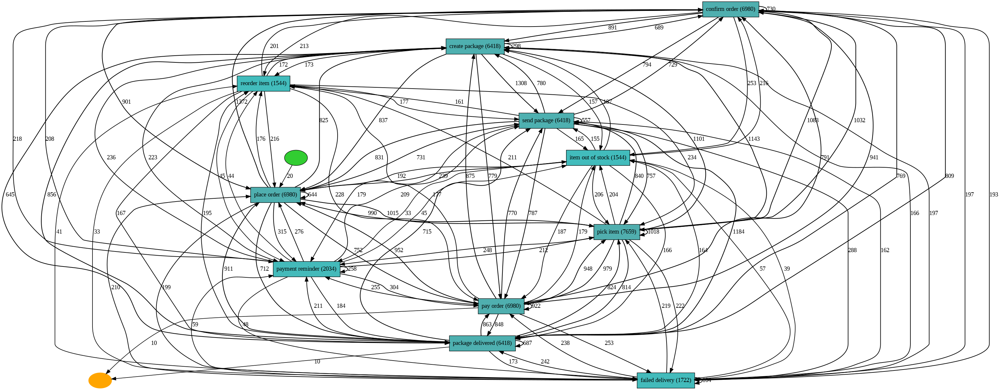

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_pr, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)

In [ ]:
flattened_log_em = pm4py.ocel_flattening(ocel, "employees")
print(flattened_log_em)

                    ocel:eid       concept:name            time:timestamp  \
0              pick_i-880003          pick item 2023-04-03 11:21:49+00:00   
1              pick_i-880001          pick item 2023-04-04 07:50:21+00:00   
2              pick_i-880006          pick item 2023-04-04 08:01:31+00:00   
3              pick_i-880020          pick item 2023-04-04 13:08:41+00:00   
4      out_of_stock_i-880016  item out of stock 2023-04-04 13:42:47+00:00   
...                      ...                ...                       ...   
17565       deliver_p-661127  package delivered 2024-05-28 10:49:37+00:00   
17566        create_p-661128     create package 2024-05-31 23:00:00+00:00   
17567          send_p-661128       send package 2024-06-03 08:20:59+00:00   
17568          send_p-661128       send package 2024-06-03 08:20:59+00:00   
17569       deliver_p-661128  package delivered 2024-06-03 10:17:54+00:00   

                  case:concept:name case:ocel:type  
0      Leah Tacke gena

In [ ]:
df = pm4py.convert_to_dataframe(flattened_log_em)
df.head()

,ocel:eid,concept:name,time:timestamp,case:concept:name,case:ocel:type
0,pick_i-880003,pick item,2023-04-03 11:21:49+00:00,Leah Tacke genannt Unterberg,employees
1,pick_i-880001,pick item,2023-04-04 07:50:21+00:00,Leah Tacke genannt Unterberg,employees
2,pick_i-880006,pick item,2023-04-04 08:01:31+00:00,Leah Tacke genannt Unterberg,employees
3,pick_i-880020,pick item,2023-04-04 13:08:41+00:00,Benedikt Knopp,employees
4,out_of_stock_i-880016,item out of stock,2023-04-04 13:42:47+00:00,Benedikt Knopp,employees


In [ ]:
print(df)

                    ocel:eid       concept:name            time:timestamp  \
0              pick_i-880003          pick item 2023-04-03 11:21:49+00:00   
1              pick_i-880001          pick item 2023-04-04 07:50:21+00:00   
2              pick_i-880006          pick item 2023-04-04 08:01:31+00:00   
3              pick_i-880020          pick item 2023-04-04 13:08:41+00:00   
4      out_of_stock_i-880016  item out of stock 2023-04-04 13:42:47+00:00   
...                      ...                ...                       ...   
17565       deliver_p-661127  package delivered 2024-05-28 10:49:37+00:00   
17566        create_p-661128     create package 2024-05-31 23:00:00+00:00   
17567          send_p-661128       send package 2024-06-03 08:20:59+00:00   
17568          send_p-661128       send package 2024-06-03 08:20:59+00:00   
17569       deliver_p-661128  package delivered 2024-06-03 10:17:54+00:00   

                  case:concept:name case:ocel:type           start_timestam

In [ ]:
print(df['ocel:eid'].nunique())

16442


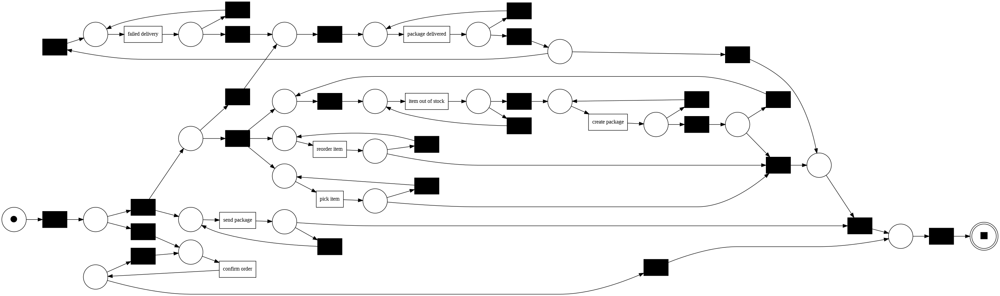

In [ ]:
net, im, fm = pm4py.discover_petri_net_inductive(flattened_log_em)
pm4py.view_petri_net(net, im, fm)

In [ ]:
replayed_traces_em = pm4py.conformance_diagnostics_token_based_replay(flattened_log_pr, net, im, fm)
replayed_traces_em

replaying log with TBR, completed traces ::   0%|          | 0/20 [00:00<?, ?it/s]

[{'trace_is_fit': False,
  'trace_fitness': 0.9990949389357195,
  'activated_transitions': [(tau_1, None),
   (tauSplit_7, None),
   (tauSplit_24, None),
   (293c35d5-f2dd-4fe3-9787-2d665ac6b278, 'pick item'),
   (skip_44, None),
   (293c35d5-f2dd-4fe3-9787-2d665ac6b278, 'pick item'),
   (91ef6d2f-c1ae-4c9b-af65-ab292cfe3e7e, 'confirm order'),
   (skip_44, None),
   (293c35d5-f2dd-4fe3-9787-2d665ac6b278, 'pick item'),
   (skip_5, None),
   (91ef6d2f-c1ae-4c9b-af65-ab292cfe3e7e, 'confirm order'),
   (init_loop_32, None),
   (e8bd7d75-184f-4035-ba0b-78adf8c7a1bf, 'item out of stock'),
   (bc9c5a43-89a2-48ad-b2f8-e7cd9090a358, 'reorder item'),
   (skip_5, None),
   (91ef6d2f-c1ae-4c9b-af65-ab292cfe3e7e, 'confirm order'),
   (skip_44, None),
   (293c35d5-f2dd-4fe3-9787-2d665ac6b278, 'pick item'),
   (skip_5, None),
   (91ef6d2f-c1ae-4c9b-af65-ab292cfe3e7e, 'confirm order'),
   (skip_44, None),
   (293c35d5-f2dd-4fe3-9787-2d665ac6b278, 'pick item'),
   (skip_35, None),
   (d0333568-9f24-4b7

In [ ]:
fitness_em = pm4py.fitness_token_based_replay(flattened_log_em, net, im, fm)
fitness_em

replaying log with TBR, completed traces ::   0%|          | 0/18 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
precision_em = pm4py.precision_token_based_replay(flattened_log_em, net, im, fm)

In [2]:
precision_em

0.8542335261718234

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evalua
generalization_em = generalization_evaluator.apply(flattened_log_em, net, im, fm)
generalization_em

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_em = simplicity_evaluator.apply(net)
simplicity_em

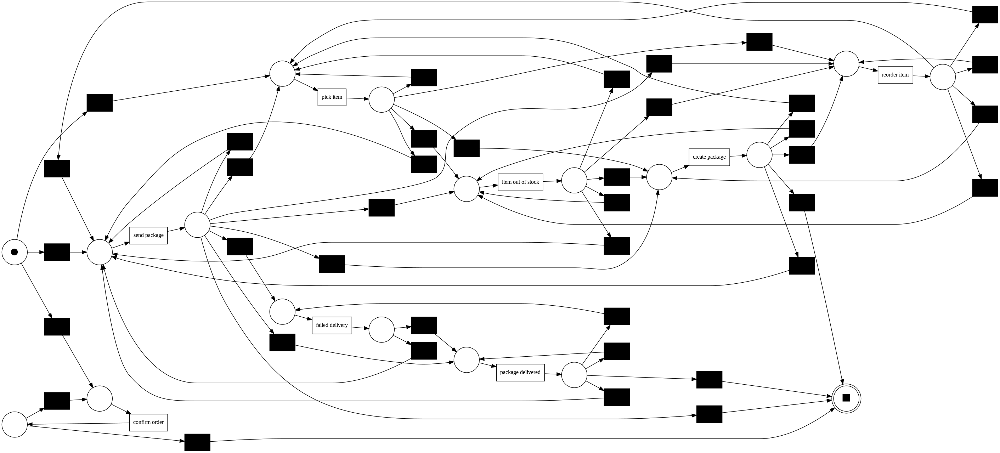

In [ ]:
net, im, fm = pm4py.discover_petri_net_heuristics(flattened_log_em, dependency_threshold=0.99)
pm4py.view_petri_net(net, im, fm)

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_em, dependency_threshold=1)
pm4py.view_heuristics_net(heu_net)

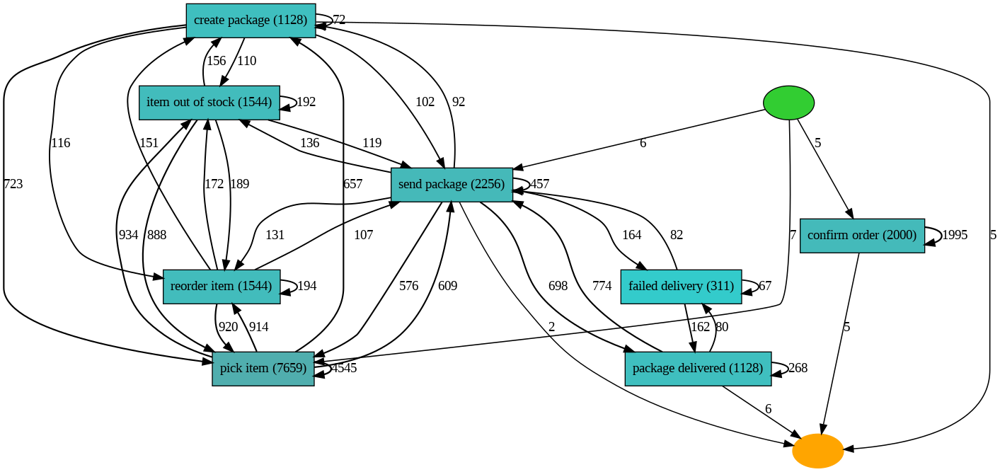

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_em, dependency_threshold=0.5)
pm4py.view_heuristics_net(heu_net)

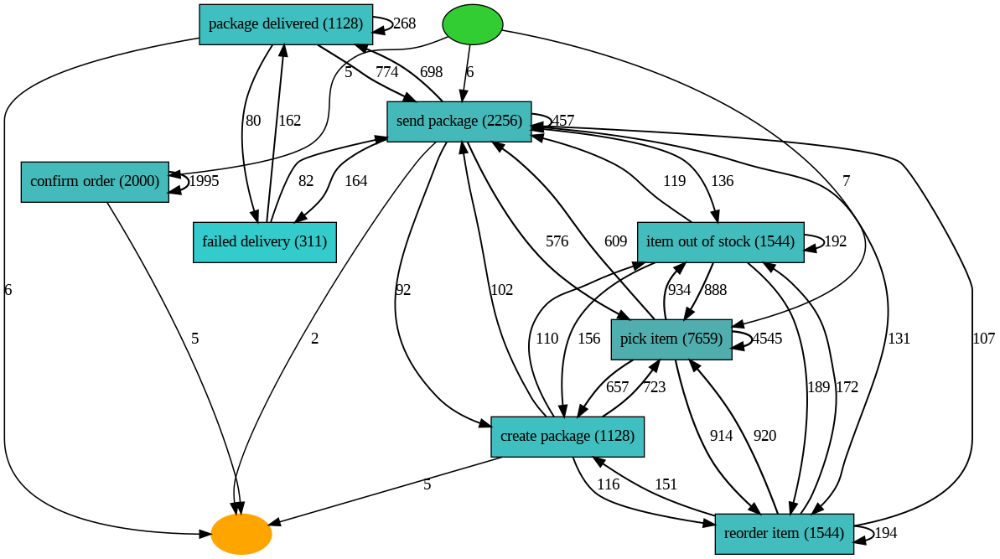

In [ ]:
heu_net = pm4py.discover_heuristics_net(flattened_log_em, dependency_threshold=0.99)
pm4py.view_heuristics_net(heu_net)